<a href="https://www.kaggle.com/code/krviswanathan/airbnb-new-york-city-eda-nlp-classification?scriptVersionId=116332048" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# 1. Introduction

Airbnb is a company that allows people to list and book accommodations in homes and apartments in various locations around the world. It was founded in 2008 and has become a popular alternative to traditional hotels. Using the Airbnb website or app, travelers can find and book unique and affordable places to stay in different locations.

The data used in this analysis was sourced from the following website: http://insideairbnb.com/get-the-data/

The "listings" dataset comprises information on 39,881 Airbnb properties in New York City, with each listing featuring 41 distinct attributes. Meanwhile, the "reviews" dataset comprises 1,064,245 guest comments pertaining to the NYC Airbnb listings.

In this notebook, we will performa an in-depth analysis by exploring the data of Airbnb listings in New York City to gain a comprehensive understanding of the short-term rental market in the area. Then, we will utilize Natural Language Processing techniques, such as sentiment analysis, to evaluate guest comments and predict their overall tone with a machine learning model.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import json

import string
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from collections import Counter
from wordcloud import WordCloud, ImageColorGenerator
!pip install vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

plotly.offline.init_notebook_mode (connected = True)

pd.set_option('display.max_columns', None)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 4.1 MB/s eta 0:00:00


# 2. Listings Dataset

In [2]:
# Load the data
listings_df = pd.read_csv('/kaggle/input/airbnbnycdataset/airbnb_listings_NY.csv')

# Dataframe information
listings_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39881 entries, 0 to 39880
Data columns (total 43 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   id                                 39881 non-null  int64  
 1   name                               39868 non-null  object 
 2   host_name                          39831 non-null  object 
 3   host_location                      32998 non-null  object 
 4   host_response_time                 26333 non-null  object 
 5   host_response_rate                 26333 non-null  object 
 6   host_acceptance_rate               28020 non-null  object 
 7   host_is_superhost                  39852 non-null  object 
 8   host_neighbourhood                 31650 non-null  object 
 9   host_has_profile_pic               39831 non-null  object 
 10  host_identity_verified             39831 non-null  object 
 11  neighbourhood                      39881 non-null  obj

In [3]:
# Summary of statistical information for the given dataset
listings_df.iloc[:, 1:].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
latitude,39881.0,40.728870,5.862338e-02,40.500314,40.68776,40.724545,40.7632,4.092881e+01
longitude,39881.0,-73.945665,5.787026e-02,-74.269520,-73.98334,-73.953710,-73.9256,-7.369006e+01
accommodates,39881.0,2.932549,1.996289e+00,0.000000,2.00000,2.000000,4.0000,1.600000e+01
bedrooms,36098.0,1.362264,7.304474e-01,1.000000,1.00000,1.000000,2.0000,1.300000e+01
beds,38997.0,1.641280,1.118583e+00,1.000000,1.00000,1.000000,2.0000,2.400000e+01
minimum_nights,39881.0,19.131742,3.143278e+01,1.000000,2.00000,14.000000,30.0000,1.250000e+03
maximum_nights,39881.0,55443.450666,1.075435e+07,1.000000,50.00000,365.000000,1125.0000,2.147484e+09
availability_30,39881.0,5.582207,8.729975e+00,0.000000,0.00000,0.000000,8.0000,3.000000e+01
availability_60,39881.0,14.875154,1.972767e+01,0.000000,0.00000,2.000000,30.0000,6.000000e+01
availability_90,39881.0,27.022467,3.169021e+01,0.000000,0.00000,8.000000,56.0000,9.000000e+01


# 3. Data Cleaning

In [4]:
listings_df.head()

,id,name,host_name,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_has_profile_pic,host_identity_verified,neighbourhood,district,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,host_listings_count,host_listings_count_entire_homes,host_listings_count_private_rooms,host_listings_count_shared_rooms,reviews_per_month
0,2539,Clean & quiet apt home by the park,John,"New York, NY",within an hour,100%,90%,f,Gravesend,t,t,Kensington,Brooklyn,40.64529,-73.97238,Private room in rental unit,Private room,2,1 shared bath,1.0,1.0,$299.00,30,730,t,21,51,81,356,9,4.89,4.88,5.00,5.00,5.00,4.75,4.88,f,9,1,6,2,0.11
1,2595,Skylit Midtown Castle,Jennifer,"New York, NY",within a day,75%,23%,f,Midtown,t,t,Midtown,Manhattan,40.75356,-73.98559,Entire rental unit,Entire home/apt,1,1 bath,NaN,1.0,$175.00,30,1125,t,0,0,5,280,49,4.68,4.73,4.63,4.77,4.80,4.81,4.40,f,3,3,0,0,0.31
2,5121,BlissArtsSpace!,Garon,"New York, NY",within an hour,100%,100%,t,Bedford-Stuyvesant,t,t,Bedford-Stuyvesant,Brooklyn,40.68535,-73.95512,Private room in rental unit,Private room,2,NaN,1.0,1.0,$60.00,30,730,t,5,30,60,335,50,4.52,4.22,4.09,4.91,4.91,4.47,4.52,f,2,0,2,0,0.31
3,45910,Beautiful Queens Brownstone! - 5BR,Mark,"New York, NY",within an hour,100%,19%,f,Ridgewood,t,t,Ridgewood,Queens,40.70309,-73.89963,Entire townhouse,Entire home/apt,16,2.5 baths,5.0,10.0,$425.00,30,730,t,30,60,90,365,13,4.42,4.64,4.36,4.82,5.00,4.82,4.55,f,6,6,0,0,0.10
4,5136,"Spacious Brooklyn Duplex, Patio + Garden",Rebecca,"New York, NY",NaN,NaN,33%,f,Greenwood Heights,t,t,Sunset Park,Brooklyn,40.66265,-73.99454,Entire rental unit,Entire home/apt,4,1.5 baths,2.0,2.0,$275.00,21,1125,t,0,0,0,179,3,5.00,5.00,5.00,5.00,5.00,4.67,5.00,f,1,1,0,0,0.03


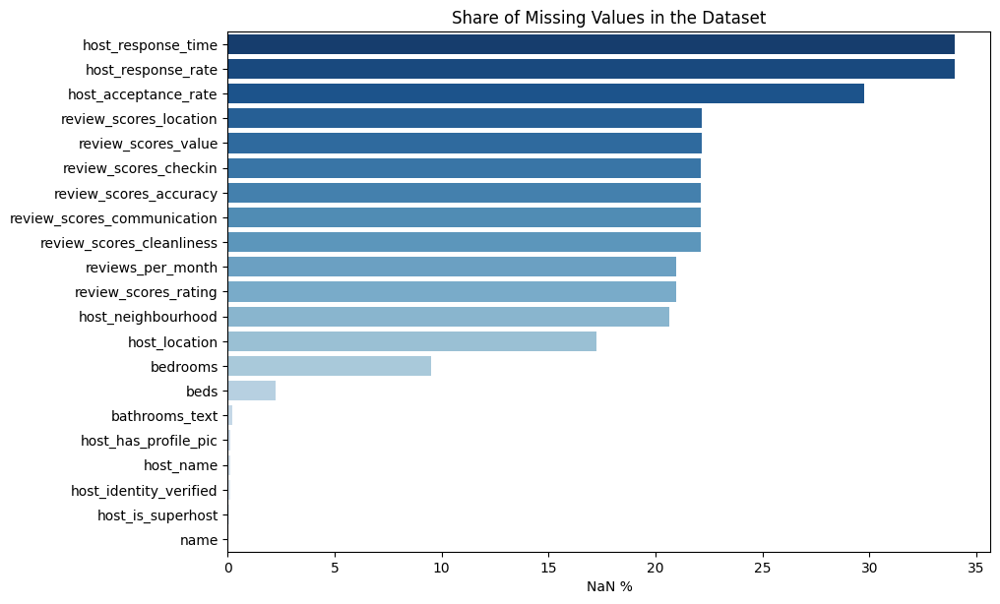

In [5]:
# Percentage of missing values in the dataset
perc_ser = (listings_df.isnull().mean() * 100).sort_values(ascending=False)
perc_ser = perc_ser[perc_ser > 0]

plt.figure(figsize=(10, 7), dpi=100)
sns.barplot(x=perc_ser.values, y=perc_ser.index, palette='Blues_r')
plt.xlabel('NaN %')
plt.title('Share of Missing Values in the Dataset');

In [6]:
# Removing '$' and ',' from the 'price' feature and convert it to float
listings_df['price'] = listings_df['price'].str.replace(',', '')
listings_df['price'] = listings_df['price'].apply(lambda val: val[1:]).astype('float')

# Replacing NaN in the following columns
for col in ['host_response_rate', 'host_acceptance_rate']:
    listings_df[col] = listings_df[col].fillna('0%')
    listings_df[col] = listings_df[col].str[:-1].astype('int')
    
    
nan_cols = ['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 
            'review_scores_communication', 'review_scores_location', 'review_scores_value', 'reviews_per_month']

for col in nan_cols:
    listings_df[col] = listings_df[col].fillna(0)
    
# For missing values of host_name columns, most of the row values are also NaN.
# Can drop the rows for host_name == NaN
host_name_null_idx = listings_df[listings_df['host_name'].isnull()].index

listings_df = listings_df.drop(host_name_null_idx, axis=0).reset_index(drop=True)

listings_df['name'] = listings_df['name'].fillna('None')

listings_df['host_location'] = listings_df['host_location'].str.replace('Zürich, Switzerland', 'Zurich, Switzerland')

listings_df['host_neighbourhood'] = listings_df['host_neighbourhood'].fillna(listings_df['neighbourhood'])

listings_df['host_location'] = listings_df['host_location'].fillna('New York, NY')

# Host Response Time: The response time is the average amount of time that it took for the host 
# to respond to all new messages in the past 30 days.
listings_df['host_response_time'] = listings_df['host_response_time'].fillna('no response')

In [7]:
# Percentage of missing values in the dataset (Updated)
perc_ser = listings_df.isnull().mean() * 100
perc_ser[perc_ser > 0]

host_is_superhost    0.072808
bathrooms_text       0.210891
bedrooms             9.497627
beds                 2.219377
dtype: float64

**According to Airbnb:** 
* Superhosts have a 4.8 or higher average overall rating based on reviews from their Airbnb guests in the past year. Guests know they can expect outstanding hospitality from these Hosts.
* Superhosts have completed at least 10 stays in the past year or 100 nights over at least 3 completed stays. Your guests can feel confident staying with an experienced host.
* Superhosts respond to 90% of new messages within 24 hours. When guests ask you questions, they know that a quick response is only a message away.

In [8]:
# Based on the definition of superhosts given by Airbnb, 
# the missing values for this feature can be filled as follows:
mask = (listings_df['host_response_rate'] >= 90) & (listings_df['review_scores_rating'] >= 4.8)

listings_df.loc[mask, 'host_is_superhost'] = listings_df.loc[mask, 'host_is_superhost'].fillna('t')

listings_df['host_is_superhost'] = listings_df['host_is_superhost'].fillna('f')

# NaN values for 'bathrooms_text' can be filled as 0  
listings_df['bathrooms_text'] = listings_df['bathrooms_text'].fillna('0 baths')

# For bedrooms with NaN, mode value is used to fill.
listings_df['bedrooms'] = listings_df['bedrooms'].fillna(1.0)

mask1 = listings_df['bedrooms'] == 1.0
mask2 = listings_df['bedrooms'] > 1.0

# 'beds' feature
listings_df.loc[mask1, 'beds'] = listings_df.loc[mask1, 'beds'].fillna(listings_df['bedrooms'])
listings_df.loc[mask2, 'beds'] = listings_df.loc[mask2, 'beds'].fillna(listings_df['bedrooms'])

# No more missing values!
perc_ser = listings_df.isnull().mean() * 100
perc_ser[perc_ser > 0]

Series([], dtype: float64)

In [9]:
# To have some consistency in reading the true or false class,
# the values 'f' and 't' are replaced with 'No' and 'Yes'
map_cols = ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'has_availability', 'instant_bookable']

for col in map_cols:
    listings_df[col] = listings_df[col].map({'f' : 'No', 't' : 'Yes'})

# 4. Data Analysis

In [10]:
listings_df.head()

,id,name,host_name,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_has_profile_pic,host_identity_verified,neighbourhood,district,latitude,longitude,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,host_listings_count,host_listings_count_entire_homes,host_listings_count_private_rooms,host_listings_count_shared_rooms,reviews_per_month
0,2539,Clean & quiet apt home by the park,John,"New York, NY",within an hour,100,90,No,Gravesend,Yes,Yes,Kensington,Brooklyn,40.64529,-73.97238,Private room in rental unit,Private room,2,1 shared bath,1.0,1.0,299.0,30,730,Yes,21,51,81,356,9,4.89,4.88,5.00,5.00,5.00,4.75,4.88,No,9,1,6,2,0.11
1,2595,Skylit Midtown Castle,Jennifer,"New York, NY",within a day,75,23,No,Midtown,Yes,Yes,Midtown,Manhattan,40.75356,-73.98559,Entire rental unit,Entire home/apt,1,1 bath,1.0,1.0,175.0,30,1125,Yes,0,0,5,280,49,4.68,4.73,4.63,4.77,4.80,4.81,4.40,No,3,3,0,0,0.31
2,5121,BlissArtsSpace!,Garon,"New York, NY",within an hour,100,100,Yes,Bedford-Stuyvesant,Yes,Yes,Bedford-Stuyvesant,Brooklyn,40.68535,-73.95512,Private room in rental unit,Private room,2,0 baths,1.0,1.0,60.0,30,730,Yes,5,30,60,335,50,4.52,4.22,4.09,4.91,4.91,4.47,4.52,No,2,0,2,0,0.31
3,45910,Beautiful Queens Brownstone! - 5BR,Mark,"New York, NY",within an hour,100,19,No,Ridgewood,Yes,Yes,Ridgewood,Queens,40.70309,-73.89963,Entire townhouse,Entire home/apt,16,2.5 baths,5.0,10.0,425.0,30,730,Yes,30,60,90,365,13,4.42,4.64,4.36,4.82,5.00,4.82,4.55,No,6,6,0,0,0.10
4,5136,"Spacious Brooklyn Duplex, Patio + Garden",Rebecca,"New York, NY",no response,0,33,No,Greenwood Heights,Yes,Yes,Sunset Park,Brooklyn,40.66265,-73.99454,Entire rental unit,Entire home/apt,4,1.5 baths,2.0,2.0,275.0,21,1125,Yes,0,0,0,179,3,5.00,5.00,5.00,5.00,5.00,4.67,5.00,No,1,1,0,0,0.03


### How quickly do Airbnb hosts respond?

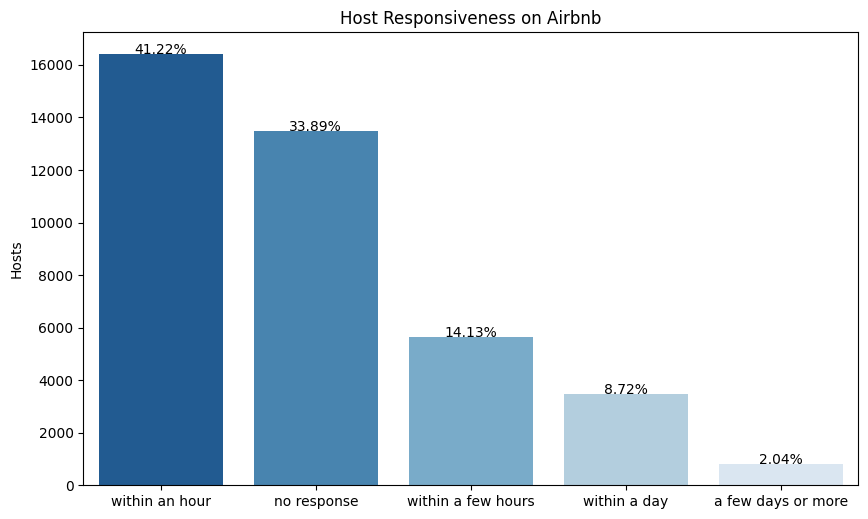

In [11]:
# Share of responses
host_resp_time = listings_df['host_response_time'].value_counts().sort_values(ascending=False)
perc_resp = host_resp_time * 100/len(listings_df)

fig, ax = plt.subplots(figsize=(10,6), dpi=100)
ax = sns.barplot(x=host_resp_time.index, y=host_resp_time.values, palette='Blues_r')
ax.set_xlabel('')
ax.set_ylabel('Hosts')
ax.set_title('Host Responsiveness on Airbnb')

patches = ax.patches

for i in range(len(patches)):
    x = patches[i].get_x() + patches[i].get_width()/2
    y = patches[i].get_height()+.5
    ax.annotate('{:.2f}%'.format(perc_resp[i]), (x, y), ha='center')

### Share of superhosts in the Airbnb host community

In [12]:
superhost_perc = listings_df['host_is_superhost'].value_counts()

fig = px.pie(superhost_perc, values=superhost_perc.values, names=superhost_perc.index, hole=0.3,
             color_discrete_sequence=px.colors.qualitative.T10)
fig.update_traces(textposition='inside', 
                  textinfo='label+percent', rotation=126)
fig.update_layout(showlegend=False)
fig.show()

### Share of listings per Boroughs

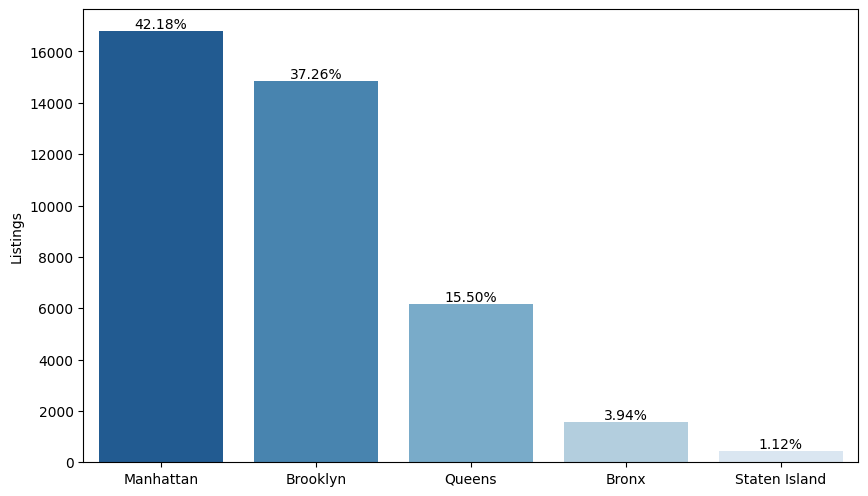

In [13]:
fig, ax = plt.subplots(figsize=(10, 6), dpi=100)
sns.countplot(data=listings_df, x='district', order = listings_df['district'].value_counts().index, palette = 'Blues_r')
ax.set_xlabel('')
ax.set_ylabel('Listings')
patches = ax.patches
perc = listings_df['district'].value_counts().sort_values(ascending=False) * 100 / len(listings_df)
    
for i in range(len(patches)):
    x = patches[i].get_x() + patches[i].get_width()/2
    y = patches[i].get_height()+100
    ax.annotate('{:.2f}%'.format(perc[i]), (x, y), ha='center')

### Airbnb listings per neighborhood

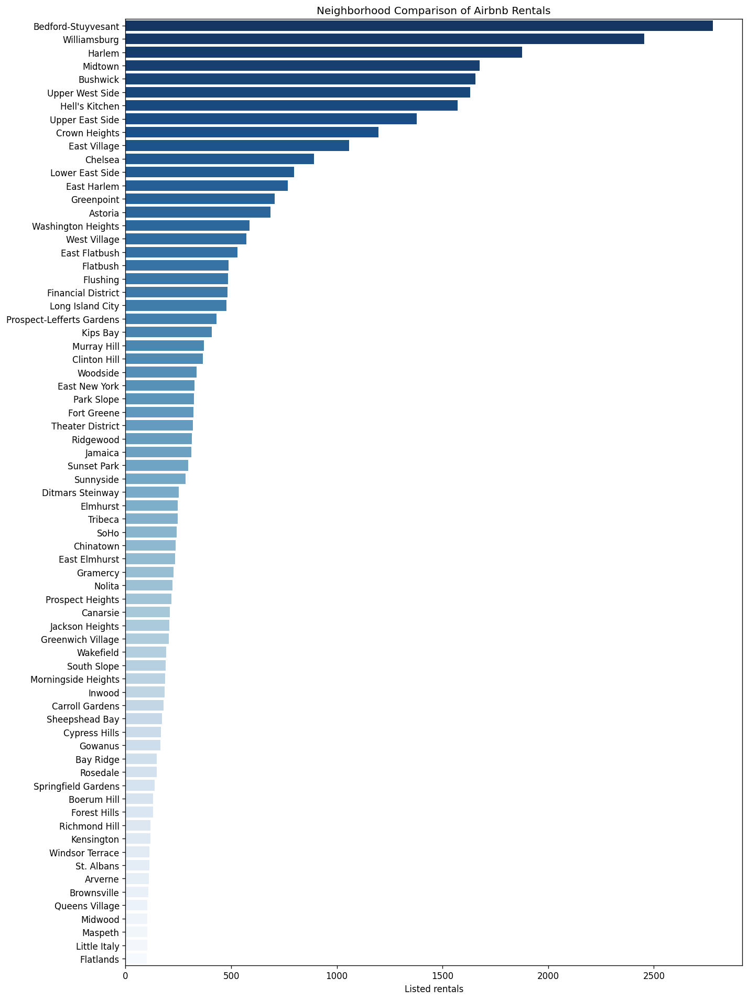

In [14]:
air_nbhood_50 = listings_df['neighbourhood'].value_counts()
air_nbhood_50 = air_nbhood_50[air_nbhood_50 > 100]
plt.figure(figsize=(12,16), dpi=120)
sns.barplot(x=air_nbhood_50.values, y=air_nbhood_50.index, palette='Blues_r')
plt.xlabel('Listed rentals')
plt.title('Neighborhood Comparison of Airbnb Rentals')
plt.tight_layout();

### Average nightly rate of Airbnb rentals

In [15]:
avg_price = round(listings_df['price'].mean(), 2)
print(f'Average price per night: ${avg_price}')

Average price per night: $197.21


### Airbnb rental price distribution

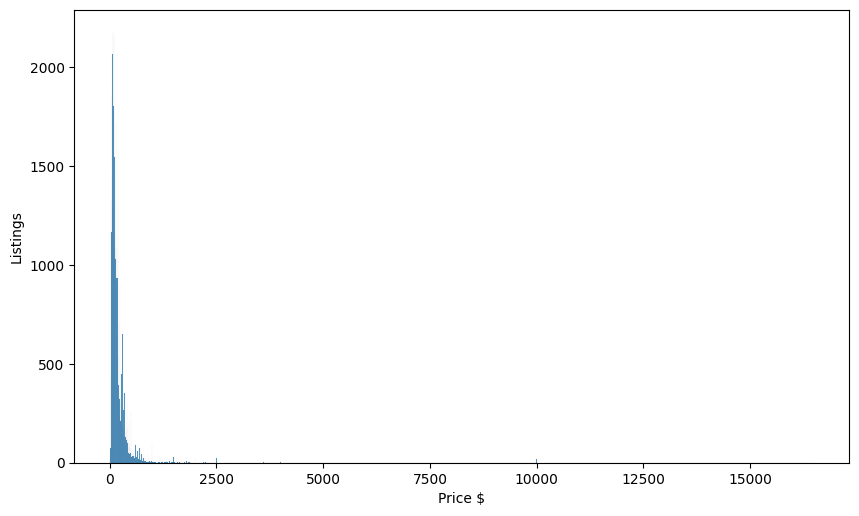

In [16]:
plt.figure(figsize=(10, 6), dpi=100)
sns.histplot(data=listings_df, x='price')
plt.xlabel('Price $')
plt.ylabel('Listings');

### Price distribution of Airbnb rentals under \\$200

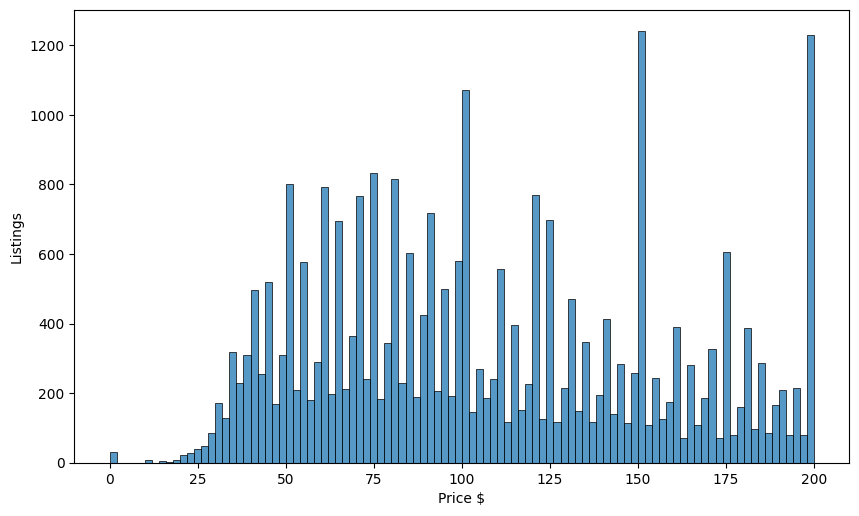

In [17]:
plt.figure(figsize=(10, 6), dpi=100)
sns.histplot(data=listings_df, x='price', bins=100, binrange=[0, 200])
plt.xlabel('Price $')
plt.ylabel('Listings');

### Average nightly rate of rentals in New York City Boroughs

In [18]:
nycmap = json.load(open('/kaggle/input/airbnbnycdataset/nyc.geojson'))

price_avg = listings_df.groupby('district')['price'].mean().to_frame().reset_index()
price_avg = price_avg.rename(columns={'price' : 'Average Price', 'district' : 'Borough'})
price_avg['Average Price'] = price_avg['Average Price'].apply(lambda x: np.round(x, 2))

fig = px.choropleth_mapbox(data_frame=price_avg, 
                    locations='Borough',
                    geojson=nycmap, 
                    featureidkey='properties.boro_name',
                    color='Borough',
                    hover_data = ['Average Price'],
                    title='Average Nightly Price in Boroughs')

fig.update_layout(mapbox_style="carto-positron", mapbox_zoom=8.3, mapbox_center = {"lat": 40.7, "lon": -74.01})


fig.show()

### Details of every listing in each Borough of NYC

In [19]:
fig = px.scatter_mapbox(listings_df, lat='latitude', lon='longitude',
                    size='price',
                    color='district',
                    hover_name='name',
                    hover_data=['neighbourhood'],
                    labels={'district' : 'Borough', 'neighbourhood' : 'Neighborhood', 'price' : 'Price'},
                    color_continuous_scale=px.colors.qualitative.D3,
                    )
    
fig.update_layout(mapbox_style="carto-positron", mapbox_zoom=8.5, mapbox_center = {"lat": 40.72, "lon": -74.01})


fig.show()

### Average price per night in the neighborhood of NYC

In [20]:
price_nhood_listings_df = listings_df.groupby(['district', 'neighbourhood'])['price'].mean().to_frame()
price_nhood_listings_df = price_nhood_listings_df.reset_index()

# Sunburst chart for displaying the average price per night in the neighborhood
fig = px.sunburst(price_nhood_listings_df, path=['district', 'neighbourhood'], 
                  values='price', color='district',
                  color_discrete_sequence=px.colors.qualitative.Set1, width=750, height=750)
fig.show()

### Profile picture and identity verification status of Airbnb hosts

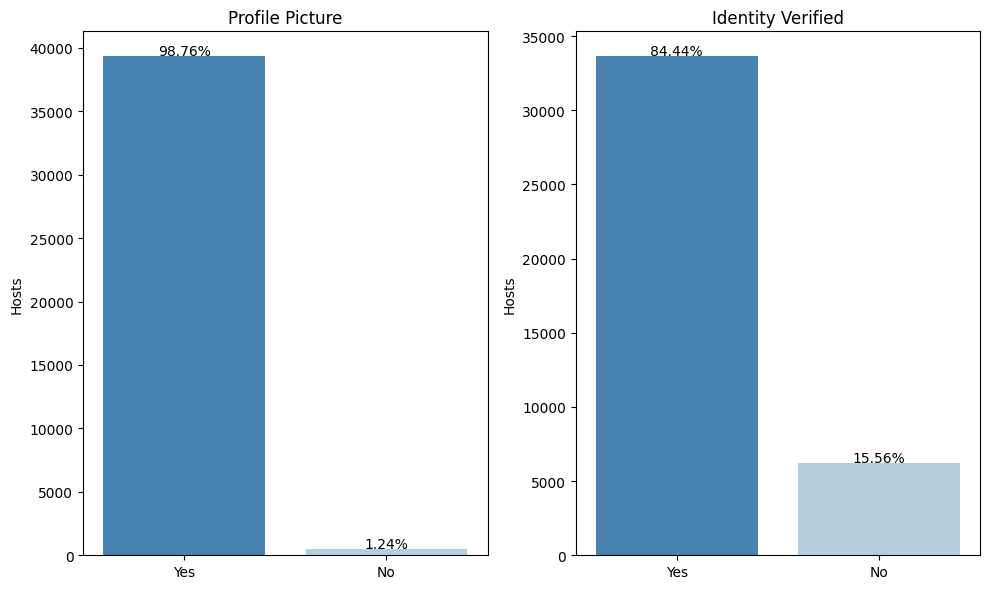

In [21]:
# Hosts identity
host_cols = ['host_has_profile_pic', 'host_identity_verified']
title_cols = ['Profile Picture', 'Identity Verified']

fig, ax = plt.subplots(1, 2, figsize=(10,6), dpi=100)

for ax, col, t in list(zip(ax.ravel(), host_cols, title_cols)):
    sns.countplot(data=listings_df, x=col, palette='Blues_r', ax=ax)
    ax.set_ylabel('Hosts')
    ax.set_xlabel('')
    ax.set_title(t)
    
    patches = ax.patches
    perc = listings_df[col].value_counts() * 100 / len(listings_df)
    
    for i in range(len(patches)):
        x = patches[i].get_x() + patches[i].get_width()/2
        y = patches[i].get_height()+100
        ax.annotate('{:.2f}%'.format(perc[i]), (x, y), ha='center')
plt.tight_layout()
    

### Distribution of different types of listings

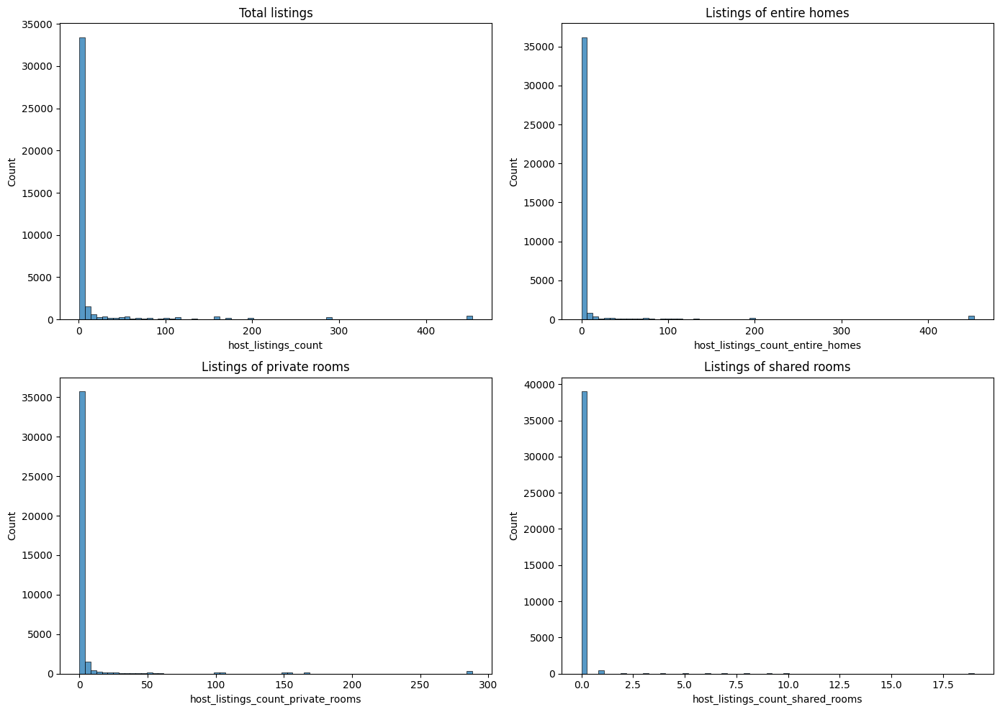

In [22]:
listings_cols = ['host_listings_count', 'host_listings_count_entire_homes', 
                 'host_listings_count_private_rooms', 'host_listings_count_shared_rooms']

title_cols = ['Total listings', 'Listings of entire homes', 
              'Listings of private rooms', 'Listings of shared rooms']

fig, ax = plt.subplots(2, 2, figsize=(14, 10), dpi=100)

for ax, col, t in list(zip(ax.ravel(), listings_cols, title_cols)):
    sns.histplot(data=listings_df, x=col, palette='Blues_r', ax=ax, bins=70)
    ax.set_ylabel('Count')
    ax.set_xlabel(col)
    ax.set_title(t)
plt.tight_layout()

### Distribution analysis of listing types

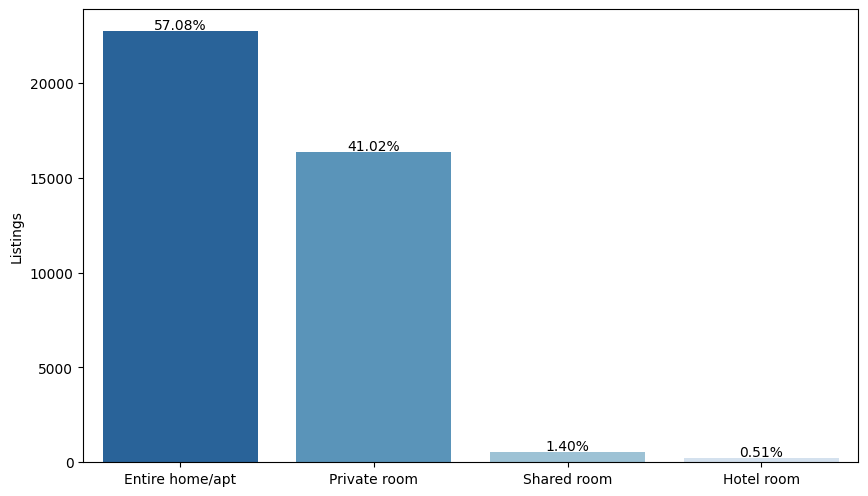

In [23]:
fig, ax = plt.subplots(figsize=(10, 6), dpi=100)
sns.countplot(data=listings_df, x='room_type', order = listings_df['room_type'].value_counts().index, palette = 'Blues_r')
ax.set_xlabel('')
ax.set_ylabel('Listings')
patches = ax.patches
perc = listings_df['room_type'].value_counts().sort_values(ascending=False) * 100 / len(listings_df)
    
for i in range(len(patches)):
    x = patches[i].get_x() + patches[i].get_width()/2
    y = patches[i].get_height()+100
    ax.annotate('{:.2f}%'.format(perc[i]), (x, y), ha='center')

### Minimum nights required for stay

From the distribution of listings for minimum night requirements, the listings can be divided into short-term rentals (less than 30 nights) and long-term rentals (greater than 30 nights).

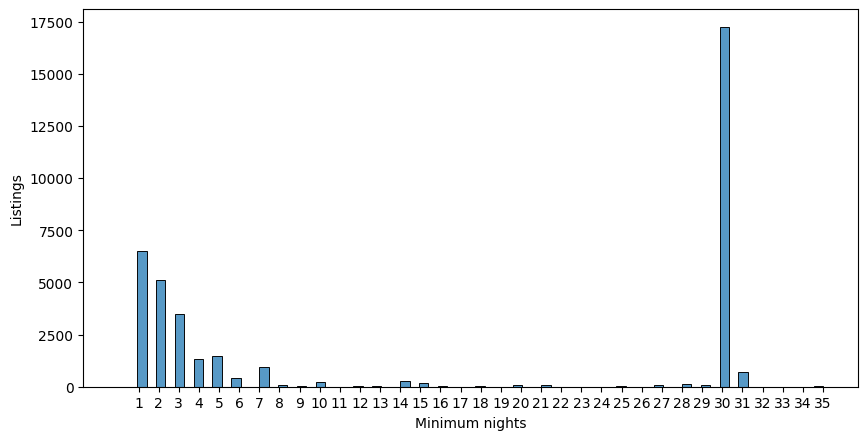

In [24]:
plt.figure(figsize=(10,5), dpi=100)
sns.histplot(data=listings_df, x='minimum_nights', bins=75, binrange=[0, 35])
plt.xlabel('Minimum nights')
plt.ylabel('Listings')
#plt.title('Minimum nights for listbings')
plt.xticks(np.arange(1, 36));

In [25]:
# Short-term rentals and its share
short_term_rentals_c = len(listings_df[listings_df['minimum_nights'] < 30]['minimum_nights'])
short_term_rentals_p = round(100 * short_term_rentals_c / len(listings_df), 2)
print(f'Short-term rentals: {short_term_rentals_c} listings ({short_term_rentals_p}%)')

# Long-term rentals and its share
long_term_rentals_c = len(listings_df[listings_df['minimum_nights'] >= 30]['minimum_nights'])
long_term_rentals_p = round(100 * long_term_rentals_c / len(listings_df), 2)
print(f'Long-term rentals: {long_term_rentals_c} listings ({long_term_rentals_p}%)')

Short-term rentals: 20731 listings (52.05%)
Long-term rentals: 19100 listings (47.95%)


### Listings per host

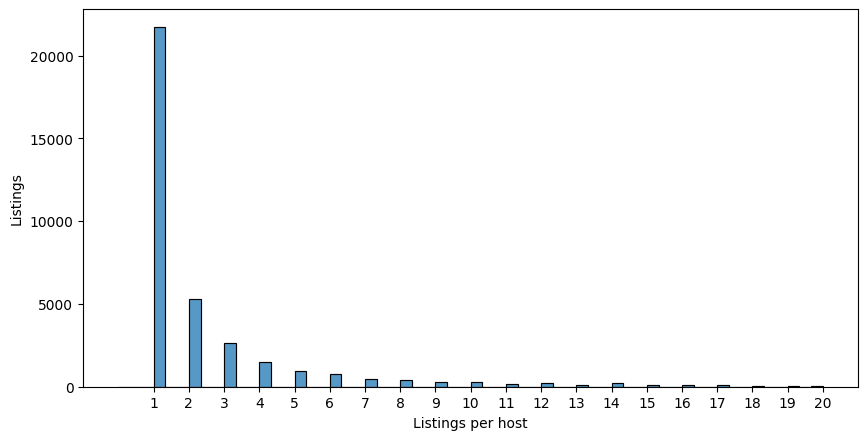

In [26]:
plt.figure(figsize=(10, 5), dpi=100)
sns.histplot(data=listings_df, x='host_listings_count', bins=60, binrange=[0, 20], stat='count')
plt.xlabel('Listings per host')
plt.ylabel('Listings')
plt.xticks(np.arange(1, 21));

In [27]:
# Single listings and its share
single_listings_c = len(listings_df[listings_df['host_listings_count'] == 1.0]['host_listings_count'])
single_listings_p = round(100 * single_listings_c / len(listings_df), 2)
print(f'Single listings: {single_listings_c} listings ({single_listings_p}%)')

# Multiple listings and its share
multiple_listings_c = len(listings_df[listings_df['host_listings_count'] > 1.0]['host_listings_count'])
multiple_listings_p = round(100 * multiple_listings_c / len(listings_df), 2)
print(f'Multiple listings: {multiple_listings_c} listings ({multiple_listings_p}%)')

Single listings: 21719 listings (54.53%)
Multiple listings: 18112 listings (45.47%)


### Total listings per host

In [28]:
hosts_room_count = listings_df.pivot_table(index='host_name', columns='room_type', aggfunc='size', fill_value=0)

hosts_room_count = hosts_room_count.rename_axis(None, axis=1)

hosts_room_count['total_listings'] = hosts_room_count.sum(axis=1) # row-wise sum of all column values

top_hosts_listings = hosts_room_count.sort_values(by=['total_listings'], ascending=False)

# Top 10 hosts based on total number of listings
top_hosts_listings.head(10)

,Entire home/apt,Hotel room,Private room,Shared room,total_listings
host_name,,,,,
Blueground,453,0,0,0,453
Michael,218,0,101,2,321
Eugene,7,0,292,0,299
David,173,0,106,2,281
Untitled,197,0,3,0,200
John,109,0,84,7,200
Michelle,75,0,108,1,184
Daniel,131,0,50,1,182
Hiroki,7,0,168,0,175


### Availability and instant booking options

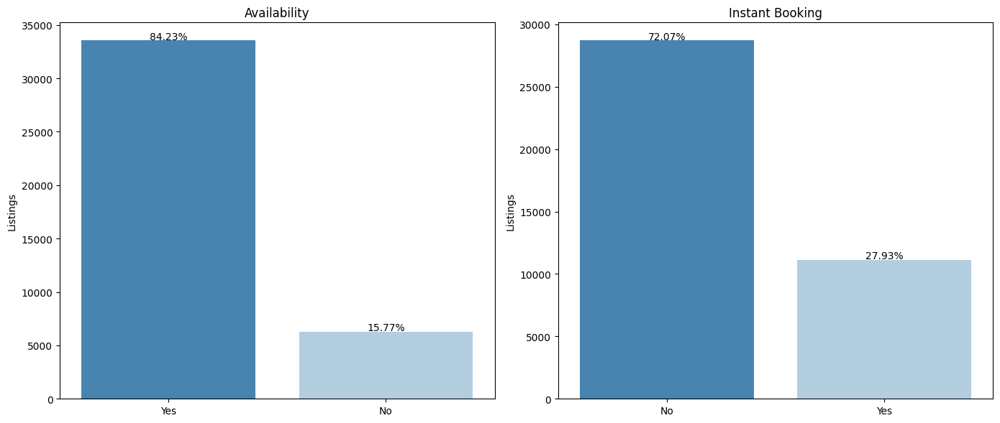

In [29]:
host_cols = ['has_availability', 'instant_bookable']
title_cols = ['Availability', 'Instant Booking']

fig, ax = plt.subplots(1, 2, figsize=(14, 6), dpi=100)

for ax, col, t in list(zip(ax.ravel(), host_cols, title_cols)):
    sns.countplot(data=listings_df, x=col, palette='Blues_r', ax=ax)
    ax.set_ylabel('Listings')
    ax.set_xlabel('')
    ax.set_title(t)
    
    patches = ax.patches
    perc = listings_df[col].value_counts() * 100 / len(listings_df)
    
    for i in range(len(patches)):
        x = patches[i].get_x() + patches[i].get_width()/2
        y = patches[i].get_height()+100
        ax.annotate('{:.2f}%'.format(perc[i]), (x, y), ha='center')
plt.tight_layout()

# 5. Summary of EDA

* The data analysis of Airbnb listings in New York revealed several interesting insights. 


* Firstly, the majority of Airbnb listings in New York City are located in Manhattan, with Brooklyn coming in second place.


* The most popular neighborhood for Airbnb rentals is Belistings_dford-Stuyvesant, followed by Williamsburg, Harlem, Midtown, and Bushwick. 


* The analysis of Airbnb rental data in New York City found that the average price per night is \\$197.21, with a range of prices from as low as \\$10 for a shared or private room to as high as \\$16,000 for a private room in a boutique hotel that can accommodate up to 14 people in Manhattan.

# 6. Reviews Dataset

In [30]:
reviews_df = pd.read_parquet("/kaggle/input/airbnbnycdataset/airbnb_nyc_comments.parquet")
reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1064245 entries, 0 to 1064244
Data columns (total 6 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   listing_id     1064245 non-null  int64         
 1   id             1064245 non-null  int64         
 2   date           1064245 non-null  datetime64[ns]
 3   reviewer_id    1064245 non-null  int64         
 4   reviewer_name  1064245 non-null  object        
 5   comments       1064245 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 48.7+ MB


### Both the listings and reviews datasets contain the 'id' for the listing. So we will merge these two dataframes based on the listing id.

In [31]:
df = reviews_df.merge(listings_df, left_on='listing_id', right_on='id')[['listing_id', 'date', 'name', 
                                                                         'district', 'reviewer_name', 'comments']]

df = df.rename(columns={'name' : 'listing_name'})
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1064235 entries, 0 to 1064234
Data columns (total 6 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   listing_id     1064235 non-null  int64         
 1   date           1064235 non-null  datetime64[ns]
 2   listing_name   1064235 non-null  object        
 3   district       1064235 non-null  object        
 4   reviewer_name  1064235 non-null  object        
 5   comments       1064235 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(4)
memory usage: 56.8+ MB


In [32]:
df.head()

,listing_id,date,listing_name,district,reviewer_name,comments
0,2539,2015-12-04,Clean & quiet apt home by the park,Brooklyn,Peter,Great host
1,2539,2016-08-27,Clean & quiet apt home by the park,Brooklyn,Liz,Nice room for the price. Great neighborhood. J...
2,2539,2016-10-01,Clean & quiet apt home by the park,Brooklyn,Евгений,Very nice apt. New remodeled.
3,2539,2017-02-20,Clean & quiet apt home by the park,Brooklyn,George,Great place to stay for a while. John is a gre...
4,2539,2017-03-19,Clean & quiet apt home by the park,Brooklyn,Carlos,.


In [33]:
# No missing data
df.isna().sum()

listing_id       0
date             0
listing_name     0
district         0
reviewer_name    0
comments         0
dtype: int64

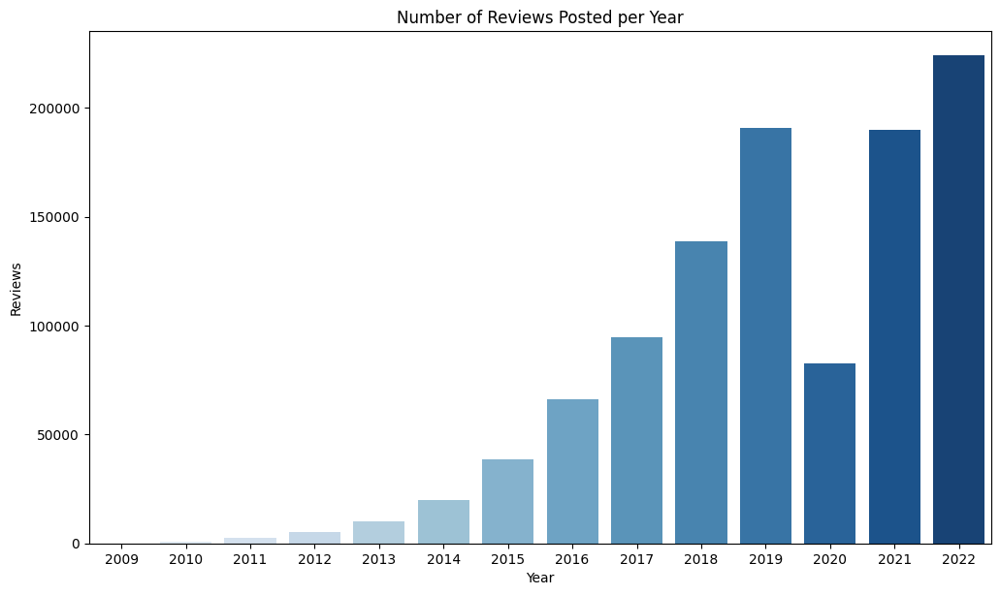

In [34]:
df['year'] = df['date'].dt.year

year_df = df.groupby('year')['comments'].count()

fig, ax = plt.subplots(figsize=(12, 7), dpi=100)
sns.barplot(x=year_df.index, y=year_df.values, palette='Blues')
# ax.yaxis.set_major_formatter(ticker.EngFormatter())
ax.set_ylabel("Reviews")
ax.set_xlabel("Year")
ax.set_title("Number of Reviews Posted per Year");

# 7. Text Processing

In [35]:
rem_records = df[df['comments'].isin(['.', ''])].index

df = df.drop(rem_records).reset_index(drop=True)

df['corpus'] = df['comments'].apply(lambda x: x.strip())

# Removing punctuations from the reviews
def remove_punc(corpus):
    nopunc_corpus = []
    
    for char in corpus:
        if char not in string.punctuation:
            nopunc_corpus.append(char)
            
    nopunc_corpus = ''.join(nopunc_corpus)
    return nopunc_corpus

df['corpus'] = df['comments'].apply(remove_punc)

rem_corpus = df[df['corpus'].str.isspace()].index

df = df.drop(rem_corpus).reset_index(drop=True)

Given that the reviews dataset comprises comments written in a variety of languages, we will implement the use of stopwords for multiple languages in our analysis to ensure comprehensive and accurate results. This will allow us to effectively filter out common words and phrases that do not carry significant meaning, and focus on the key elements of the guest feedback.

In [36]:
#  The nltk library provides stopwords for 29 languages.
len(stopwords.fileids())

29

### Removing stopwords

In [37]:
# Instead of utilizing stopwords of all the languagues in the nltk library, 
# we will employ the stopwords only for the widely used languages.

lang_list = ['chinese', 'danish', 'dutch', 'english', 'finnish', 'french', 
         'german', 'hungarian', 'italian', 'portuguese', 'romanian', 
         'russian', 'spanish', 'swedish', 'turkish']

sw_multilang = []

for lang in lang_list:
    for sw in stopwords.words(lang):
        sw_multilang.append(sw)
    
# Frequent words that do not provide meaningful insight are also included in the stopwords list

freq_words = ['airbnb', 'room', 'apt', 'apartment', 'neighborhood', 'neighbourhood', 'host', 'guest', 
              'location', 'apartment', 'manhattan', 'brooklyn', 'bronx', 'staten', 'island', 'queens', 
              'travel', 'property', 'nyc', 'u', 'would', 'place', 'time', 'new', 'york', 
              'station', 'subway', 'home', 'us']

stopwords_list = sw_multilang + freq_words

# Function to remove stopwords from the comments
def remove_stopwords(corpus):
    
    words = corpus.split()
    
    no_stopwords = []
    
    for word in words:
        if word.lower() not in stopwords_list:
            no_stopwords.append(word.lower())
            
    no_stopwords = ' '.join(no_stopwords)
    
    return no_stopwords

df['corpus'] = df['corpus'].apply(remove_stopwords)

### Wordcloud

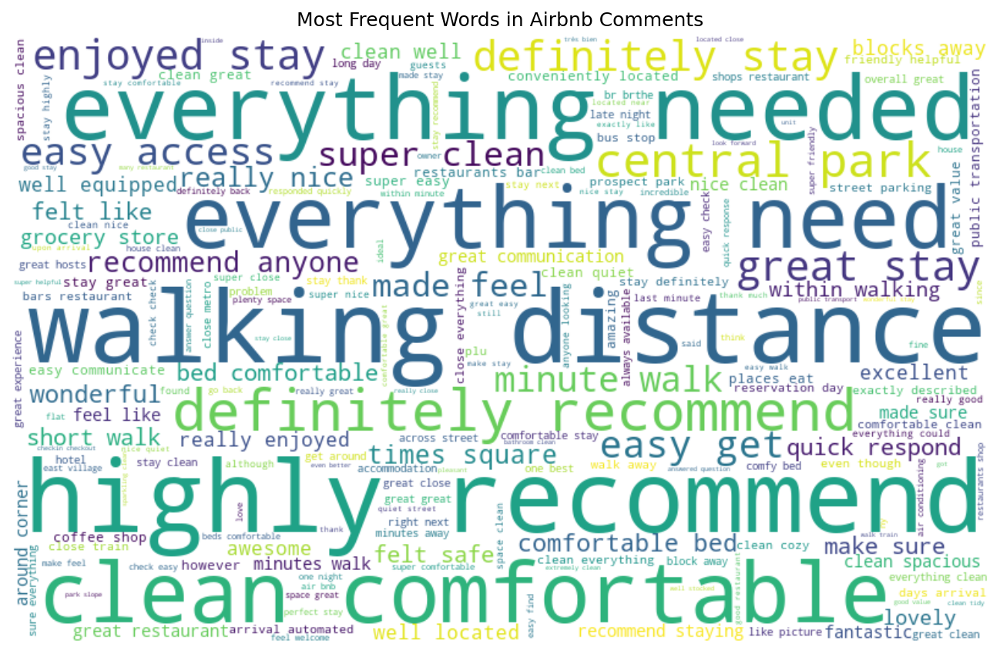

In [38]:
text = ''.join(w for w in df['corpus'])

wordcloud = WordCloud(stopwords=stopwords_list, max_words=200, max_font_size= 300,  
                      width=800, height=500, background_color='white')

wordcloud.generate(text)

plt.figure(figsize=(12, 7), dpi=150)
plt.imshow(wordcloud.recolor(random_state=8888), interpolation='bilinear')
plt.title("Most Frequent Words in Airbnb Comments")
plt.axis("off")
plt.show()

# 8. VADER Sentiment Analysis

VADER stands for **Valence Aware Dictionary and sEntiment Reasoner**. It is a opinion mining tool that analyzes the emotions expressed by the people in social media. The polarity_score() applied to a text returns a dictionary of four keys: positive (pos), negative (neg), neutral (neu), and compound. 


In [39]:
vader = SentimentIntensityAnalyzer()
df['compound_scr'] = df['corpus'].apply(lambda text: vader.polarity_scores(text)['compound'])

def vader_sentiment(score):
    if score > 0:
        return 'Positive'
    elif score < 0:
        return 'Negative'
    else:
        return 'Neutral'
    
df['sentiment'] = df['compound_scr'].apply(vader_sentiment)

df.head(3)

,listing_id,date,listing_name,district,reviewer_name,comments,year,corpus,compound_scr,sentiment
0,2539,2015-12-04,Clean & quiet apt home by the park,Brooklyn,Peter,Great host,2015,great,0.6249,Positive
1,2539,2016-08-27,Clean & quiet apt home by the park,Brooklyn,Liz,Nice room for the price. Great neighborhood. J...,2016,nice price great john accommodating bottles wa...,0.9186,Positive
2,2539,2016-10-01,Clean & quiet apt home by the park,Brooklyn,Евгений,Very nice apt. New remodeled.,2016,nice remodeled,0.4215,Positive


### Proportion of reviews based on sentiment

In [40]:
sentiment_share = df['sentiment'].value_counts()

fig = px.pie(sentiment_share, values=sentiment_share.values, names=sentiment_share.index, hole=0.25,
             color_discrete_sequence=px.colors.qualitative.T10)
fig.update_traces(textposition='inside', 
                  textinfo='label+percent', rotation=100)
fig.update_layout(showlegend=False)
fig.show()

### Most frequent words in positive reviews

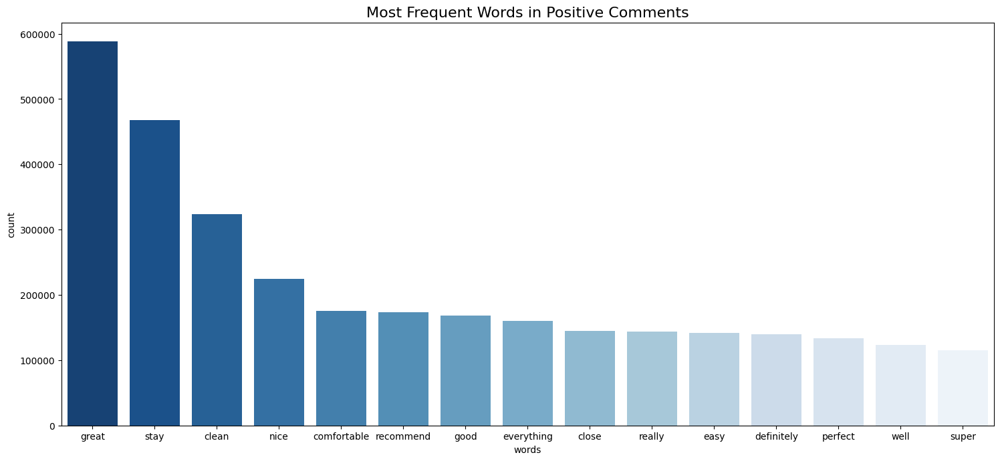

In [41]:
mask = df['sentiment'] == 'Positive'

pos_words = df[mask]['corpus'].apply(lambda x: [word for word in x.split()])

pos_word_count = Counter()

for word in pos_words:
    pos_word_count.update(word)
    
pos_words_df = pd.DataFrame(pos_word_count.most_common(15), columns=['words', 'count'])
plt.figure(figsize=(18, 8), dpi=100)
sns.barplot(data=pos_words_df, x='words', y='count', palette='Blues_r')
plt.title("Most Frequent Words in Positive Comments", fontsize=16);

### Most frequent words for negative reviews

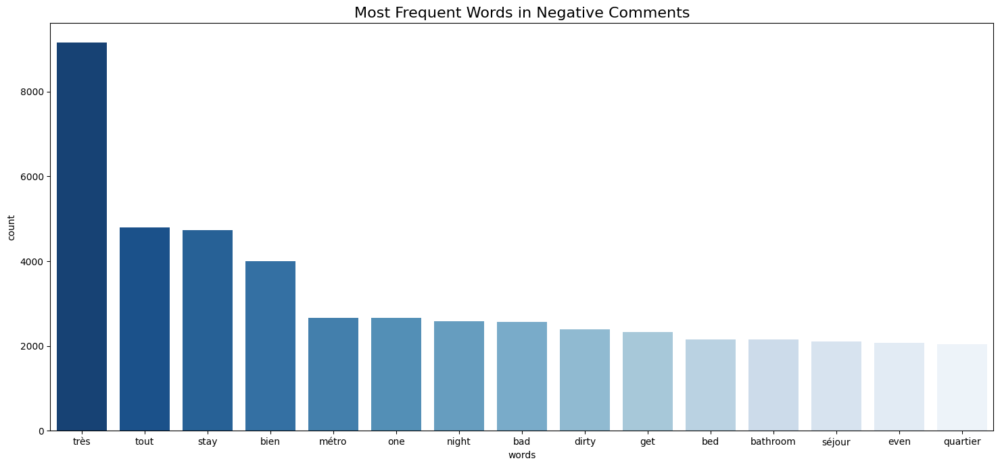

In [42]:
mask = df['sentiment'] == 'Negative'

neg_words = df[mask]['corpus'].apply(lambda x: [word for word in x.split()])

neg_word_count = Counter()

for word in neg_words:
    neg_word_count.update(word)
    
neg_words_df = pd.DataFrame(neg_word_count.most_common(15), columns=['words', 'count'])
plt.figure(figsize=(18, 8), dpi=100)
sns.barplot(data=neg_words_df, x='words', y='count', palette='Blues_r')
plt.title("Most Frequent Words in Negative Comments", fontsize=16);

### Most frequent words in neutral reviews

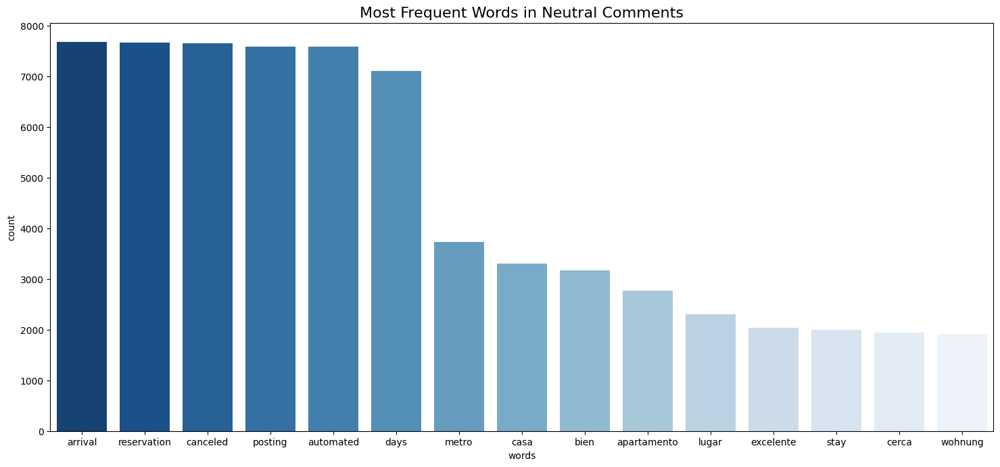

In [43]:
mask = df['sentiment'] == 'Neutral'

neut_words = df[mask]['corpus'].apply(lambda x: [word for word in x.split()])

neut_word_count = Counter()

for word in neut_words:
    neut_word_count.update(word)

neut_words_df = pd.DataFrame(neut_word_count.most_common(15), columns=['words', 'count'])
plt.figure(figsize=(18, 8), dpi=100)
sns.barplot(data=neut_words_df, x='words', y='count', palette='Blues_r')
plt.title("Most Frequent Words in Neutral Comments",  fontsize=16);

### Number of reviews clustered by Borough

In [44]:
pos_df = df[df['sentiment'] == 'Positive'][['district', 'sentiment']].value_counts().to_frame().reset_index()
pos_df = pos_df.rename(columns={0 : '# Positive'})
pos_df = pos_df.drop('sentiment', axis=1)

neut_df = df[df['sentiment'] == 'Neutral'][['district', 'sentiment']].value_counts().to_frame().reset_index()
neut_df = neut_df.rename(columns={0 : '# Neutral'})
neut_df = neut_df.drop('sentiment', axis=1)

neg_df = df[df['sentiment'] == 'Negative'][['district', 'sentiment']].value_counts().to_frame().reset_index()
neg_df = neg_df.rename(columns={0 : '# Negative'})
neg_df = neg_df.drop('sentiment', axis=1)

sentiment_count_df = pos_df.merge(neg_df, on='district')

sentiment_count_df = sentiment_count_df.merge(neut_df, on='district')

fig = px.choropleth_mapbox(data_frame=sentiment_count_df, 
                    locations='district',
                    geojson=nycmap, 
                    featureidkey='properties.boro_name',
                    color='district',
                    hover_data = ['# Positive', '# Negative', '# Neutral'],
                    labels = {'district' : 'Borough'},
                    title ='Number of reviews for each Borough')

fig.update_layout(mapbox_style="carto-positron", mapbox_zoom=8.2, mapbox_center = {"lat": 40.7, "lon": -74.01})


fig.show()

# 9. Classification Model

We will implement a **Linear Support Vector Classification** model to predict the which reviews are positive, negative and neutral.

Classification Report: 

              precision    recall  f1-score   support

           0       0.83      0.65      0.73      7041
           1       0.91      0.94      0.93     13409
           2       0.99      1.00      0.99    351585

    accuracy                           0.99    372035
   macro avg       0.91      0.86      0.88    372035
weighted avg       0.99      0.99      0.99    372035



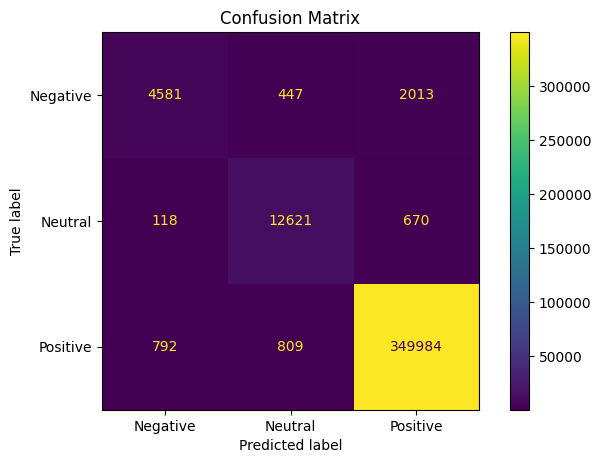

In [45]:
# Labe Encoding for the "sentiment" column
label_encoder = LabelEncoder()
df['sentiment'] = df['sentiment'].astype('category')
df['sentiment'] = label_encoder.fit_transform(df['sentiment'])

X = df['corpus']
y = df['sentiment']

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.35, random_state=8888)

# Use pipeline to perform a sequence of operations
pipe = Pipeline([('tfidf', TfidfVectorizer()), ('svc', LinearSVC())])
pipe.fit(X_train, y_train)

# Predict
y_pred = pipe.predict(X_test)

# Classification report
print("Classification Report: \n")
print(classification_report(y_test, y_pred))

# Plot confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
fig, ax = plt.subplots(figsize=(8, 5), dpi=100)
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=label_encoder.classes_)
ax.set_title("Confusion Matrix")
disp.plot(ax=ax);

### Finding the best hyperparameters for the classification model with GridSearchCV

In [46]:
stkfold = StratifiedKFold(n_splits=5)

param_svc = {'svc__C' : [0.001, 0.05, 0.1, 0.5, 0.75, 1.0]}

grid_pipe = GridSearchCV(estimator=pipe, param_grid=param_svc, cv=stkfold, n_jobs=-1)

grid_pipe.fit(X_train, y_train)

# Best parameters
grid_pipe.best_params_

{'svc__C': 0.75}

### Predicting the sentiment of the reviews for the best hyperparameters

Classification Report: 

              precision    recall  f1-score   support

           0       0.84      0.65      0.73      7041
           1       0.91      0.94      0.93     13409
           2       0.99      1.00      0.99    351585

    accuracy                           0.99    372035
   macro avg       0.91      0.86      0.88    372035
weighted avg       0.99      0.99      0.99    372035



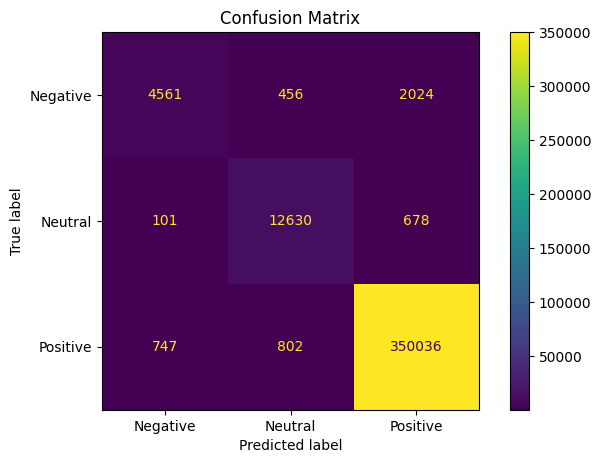

In [47]:
pipe = Pipeline([('tfidf', TfidfVectorizer()), ('svc', LinearSVC(C=0.75))])
pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)

print("Classification Report: \n")
print(classification_report(y_test, y_pred))

conf_matrix = confusion_matrix(y_test, y_pred)
fig, ax = plt.subplots(figsize=(8, 5), dpi=100)
disp = ConfusionMatrixDisplay(conf_matrix, display_labels=label_encoder.classes_)
ax.set_title("Confusion Matrix")
disp.plot(ax=ax);

The Linear Support Vector Classifier predicts the sentiment of a review with an accuracy of 0.99. However, the prediction of negative reviews is not satisfactory. This may be due to small number of negative reviews available for the training.

### Checking the model with some example reviews

In [48]:
test = ["Wonderful and kind hosts! It’s small, but enough to survive for a few days.", 
        "Wouldn't recommend this place to anyone. The host's behaviour was rude.", 
        "It was a private room. Very tiny. The bathrooms were very disappointing"]

result = pipe.predict(test)

label_encoder.inverse_transform(result)

array(['Positive', 'Negative', 'Neutral'], dtype=object)

# 11. References

* Airbnb New York Dataset: http://insideairbnb.com/get-the-data/


* NYC GeoJSON: https://gist.github.com/ix4/6f44e559b29a72c4c5d130ac13aad317?short_path=467dc07 


* VADER: https://github.com/cjhutto/vaderSentiment